<h1 style="color: white; background-color: black; font-weight: bold; text-align: center; border:3px solid black;">Alzheimer MR Images Classification using ALZH-NET + SMOTE</h1>



<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Importing Necessary Libraries</h2>

In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE
from tensorflow.keras.applications import ResNet50
res_model = ResNet50();
from tensorflow_addons.metrics import F1Score
import tensorflow as tf
def custom_model_loader(model_path):
    custom_objects = {'F1Score': F1Score}
    return tf.keras.models.load_model(model_path, custom_objects=custom_objects)
fmodel=custom_model_loader('/kaggle/input/testingmodule3/tensorflow2/test3/1/UAlzh-Net.h5')


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


102967424/102967424 [==============================] - 1s 0us/step


/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


<h2 style="color: white; background-color: grAY; font-weight: bold; text-align: center; border:3px solid black;">Importing the Dataset</h2>

In [2]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset')):
    subfolder_path = os.path.join('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 2/2 [00:01<00:00,  1.40it/s]


,image,label
0,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
1,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
2,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
3,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
4,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
...,...,...
6395,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6396,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6397,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6398,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Visualizing the Dataset</h2>

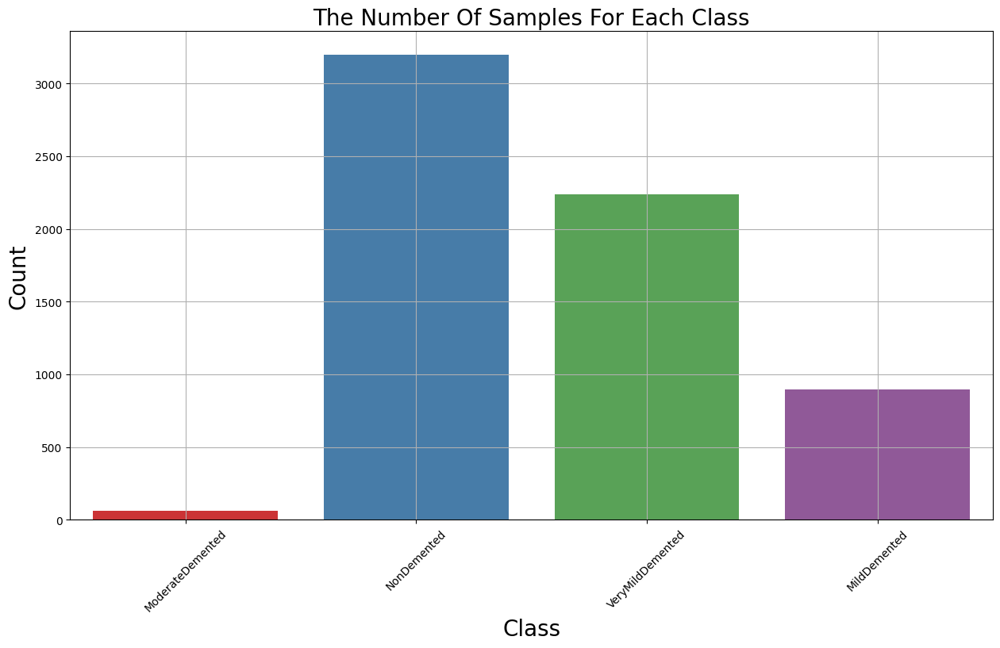

In [3]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

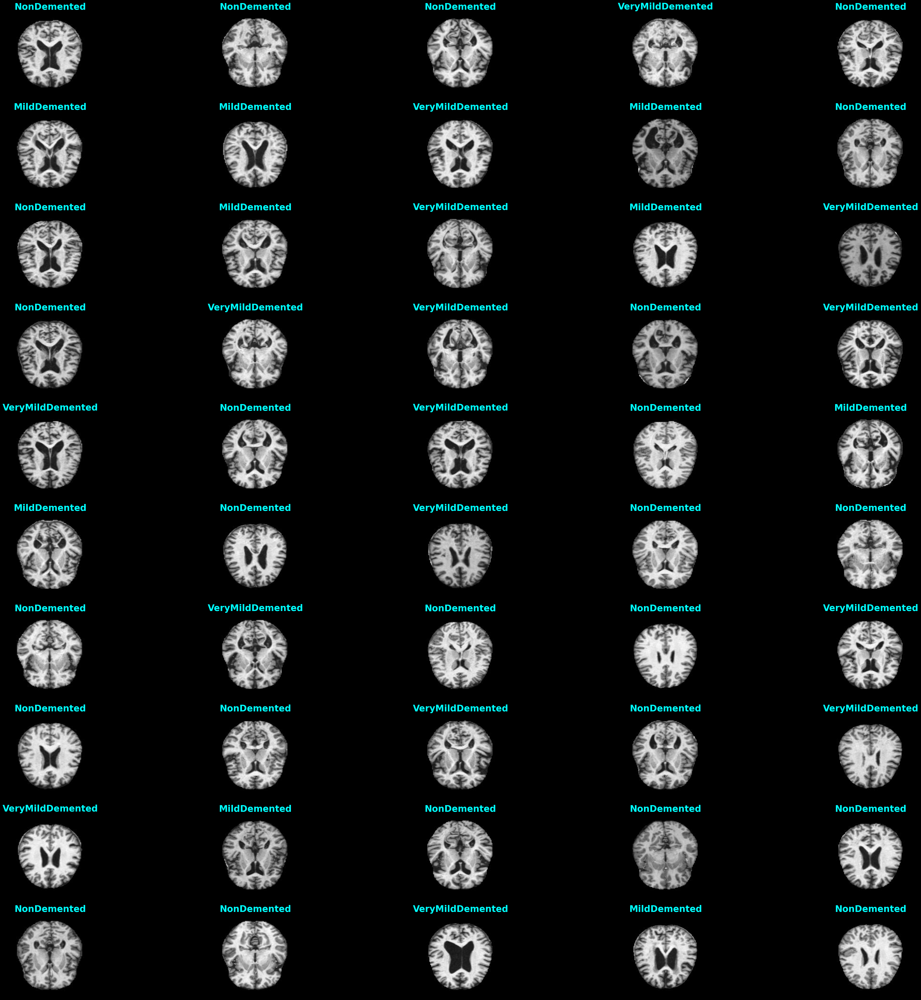

In [4]:
plt.figure(figsize=(50,50),facecolor='black')
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25,color='cyan',fontweight="bold")

In [5]:
Size=(176,176)
work_dr = ImageDataGenerator(
    rescale = 1./255
)
train_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=6500, shuffle=False)

Found 6400 validated image filenames belonging to 4 classes.


In [6]:
train_data, train_labels = train_data_gen.next()

In [7]:
class_num=np.sort(['Alzheimer_s disease','Cognitively normal','Early mild cognitive impairment','Late mild cognitive impairment'])
class_num

array(['Alzheimer_s disease', 'Cognitively normal',
       'Early mild cognitive impairment',
       'Late mild cognitive impairment'], dtype='<U31')

In [8]:
sm = SMOTE(random_state=42)
train_data, train_labels = sm.fit_resample(train_data.reshape(-1, 176 * 176 * 3), train_labels)
train_data = train_data.reshape(-1, 176,176, 3)
print(train_data.shape, train_labels.shape)

(12800, 176, 176, 3) (12800, 4)


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


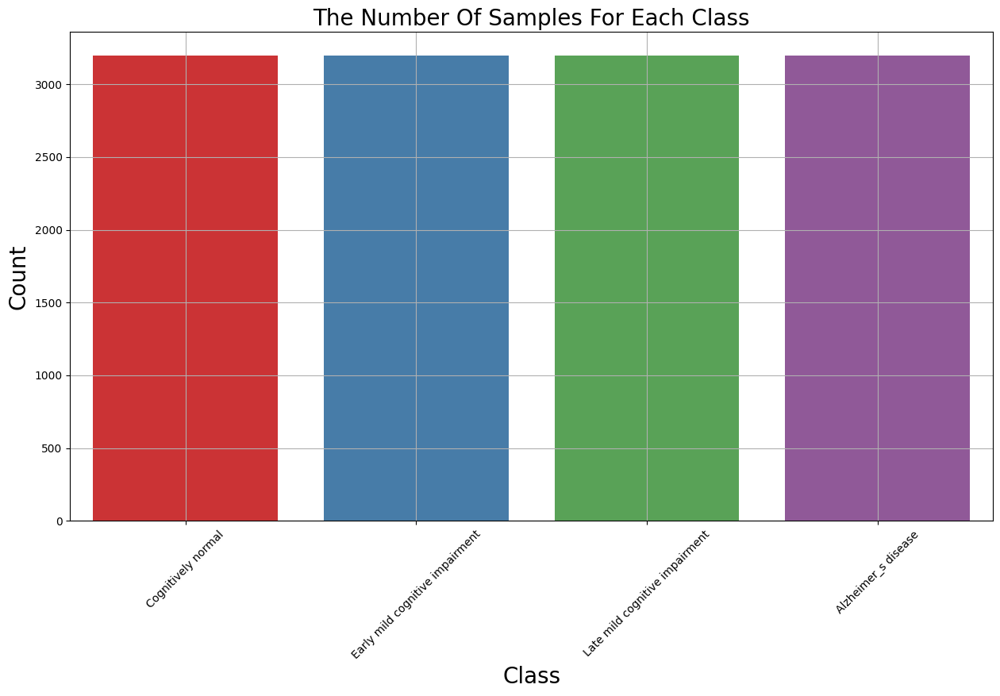

In [14]:
labels=[class_num[i] for i in np.argmax(train_labels,axis=1) ]
plt.figure(figsize=(15,8))
ax = sns.countplot(x=labels,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [9]:
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)

<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">CNN Modelling</h2>

In [13]:
'''def conv_block(filters, act='relu'):
    
    block = Sequential()
    block.add(Conv2D(filters, 3, activation=act, padding='same'))
    block.add(Conv2D(filters, 3, activation=act, padding='same'))
    block.add(BatchNormalization())
    block.add(MaxPool2D())
    
    return block
def dense_block(units, dropout_rate, act='relu'):
    
    block = Sequential()
    block.add(Dense(units, activation=act))
    block.add(BatchNormalization())
    block.add(Dropout(dropout_rate))
    
    return block

class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('val_acc') > 0.99:
            print("\nReached accuracy threshold! Terminating training.")
            self.model.stop_training = True
            
my_callback = MyCallback()

early_stopping = EarlyStopping(monitor='val_loss', patience=2)
model = Sequential([
        Input(shape=(*IMAGE_SIZE, 3)),
        
        Conv2D(16, 3, activation='relu', padding='same'),
        Conv2D(16, 3, activation='relu', padding='same'),
        MaxPool2D(),
        
        conv_block(32),
        conv_block(64),
        conv_block(128),
        
        Dropout(0.2),
        conv_block(256),
        
        Dropout(0.2),
        Flatten(),
        dense_block(512, 0.7),
        dense_block(128, 0.5),
        dense_block(64, 0.3),
        Dense(4, activation='softmax')        
    ], 
    name = "cnn_model"
)

METRICS = [
    tf.keras.metrics.CategoricalAccuracy(name='acc'),
#     tf.keras.metrics.AUC(name='auc'), 
    tfa.metrics.F1Score(num_classes=4)
]

CALLBACKS = [my_callback]
    
model.compile(optimizer='adam',
              loss=tf.losses.CategoricalCrossentropy(),
              metrics=METRICS
)

plot_model(model, show_shapes=True, show_layer_names=True, to_file='CNN_horizontal.png', rankdir='LR')
model.summary()'''
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPool2D, Dropout, Flatten, Dense, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model


model=keras.models.Sequential()
# Define the first model
def conv_block(x, filters):
    x = Conv2D(filters, 3, activation='relu', padding='same')(x)
    x = Conv2D(filters, 3, activation='relu', padding='same')(x)
    x = MaxPool2D()(x)
    return x

class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('val_acc') > 0.99:
            print("\nReached accuracy threshold! Terminating training.")
            self.model.stop_training = True
            
my_callback = MyCallback()

early_stopping = EarlyStopping(monitor='val_loss', patience=2)
def dense_block(x, units, dropout_rate):
    x = Dropout(dropout_rate)(x)
    x = Dense(units, activation='relu')(x)
    return x

IMAGE_SIZE = (176, 176)
input_layer = Input(shape=(*IMAGE_SIZE, 3))

x = Conv2D(16, 3, activation='relu', padding='same')(input_layer)
x = Conv2D(16, 3, activation='relu', padding='same')(x)
x = MaxPool2D()(x)

x = conv_block(x, 32)
x = conv_block(x, 64)
x = conv_block(x, 128)

x = Dropout(0.2)(x)
x = conv_block(x, 256)

x = Dropout(0.2)(x)
x = Flatten()(x)
x = dense_block(x, 512, 0.7)
x = dense_block(x, 128, 0.5)

# Output layer before concatenation
output_layer1 = Dense(4, activation='softmax', name='output_layer1')(x)

# Define the second model
input_layer2 = Input(shape=(176, 176, 3))
x2 = tf.keras.layers.Conv2D(32, kernel_size=(3, 3), strides=2, padding='same', activation='relu')(input_layer2)
x2 = tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2, padding='same')(x2)
x2 = tf.keras.layers.Conv2D(64, kernel_size=(3, 3), strides=2, activation='relu', padding='same')(x2)
x2 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='same')(x2)
x2 = tf.keras.layers.Conv2D(128, kernel_size=(3, 3), strides=2, activation='relu', padding='same')(x2)
x2 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='same')(x2)
x2 = tf.keras.layers.Flatten()(x2)
x2 = tf.keras.layers.Dense(1024, activation='relu')(x2)
x2 = tf.keras.layers.Dropout(0.3)(x2)

# Output layer before concatenation
output_layer2 = tf.keras.layers.Dense(4, activation='softmax', name='output_layer2')(x2)

# Concatenate the outputs
concatenated_output = Concatenate(name='concatenated_output')([output_layer1, output_layer2])

# Additional dense layer with 4 units
final_output = Dense(4, activation='softmax', name='final_output')(concatenated_output)

model1 = Model(inputs=input_layer, outputs=output_layer1, name="cnn_model")
model2 = Model(inputs=input_layer2, outputs=output_layer2, name="cnn_model_2")

# Merge the two models using Concatenate layer
CALLBACKS = [my_callback]
merged_model = Model(inputs=[input_layer, input_layer2], outputs=final_output, name="merged_model")
merged_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model=fmodel
# Display the summary of the merged model
merged_model.summary()
"""model=keras.models.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))
model.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))
model.add(keras.layers.MaxPool2D((2,2),2,padding='same'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(4,activation='softmax'))
"""

Model: "merged_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 176, 176, 3)]        0         []                            
                                                                                                  
 conv2d_13 (Conv2D)          (None, 176, 176, 16)         448       ['input_4[0][0]']             
                                                                                                  
 conv2d_14 (Conv2D)          (None, 176, 176, 16)         2320      ['conv2d_13[0][0]']           
                                                                                                  
 max_pooling2d_8 (MaxPoolin  (None, 88, 88, 16)           0         ['conv2d_14[0][0]']           
 g2D)                                                                                  

"model=keras.models.Sequential()\nmodel.add(keras.layers.Conv2D(32,kernel_size=(3,3),strides=2,padding='same',activation='relu',input_shape=(176,176,3)))\nmodel.add(keras.layers.MaxPool2D(pool_size=(2,2),strides=2,padding='same'))\nmodel.add(keras.layers.Conv2D(64,kernel_size=(3,3),strides=2,activation='relu',padding='same'))\nmodel.add(keras.layers.MaxPool2D((2,2),2,padding='same'))\nmodel.add(keras.layers.Conv2D(128,kernel_size=(3,3),strides=2,activation='relu',padding='same'))\nmodel.add(keras.layers.MaxPool2D((2,2),2,padding='same'))\nmodel.add(keras.layers.Flatten())\nmodel.add(keras.layers.Dense(1024,activation='relu'))\nmodel.add(keras.layers.Dropout(0.3))\nmodel.add(keras.layers.Dense(4,activation='softmax'))\n"

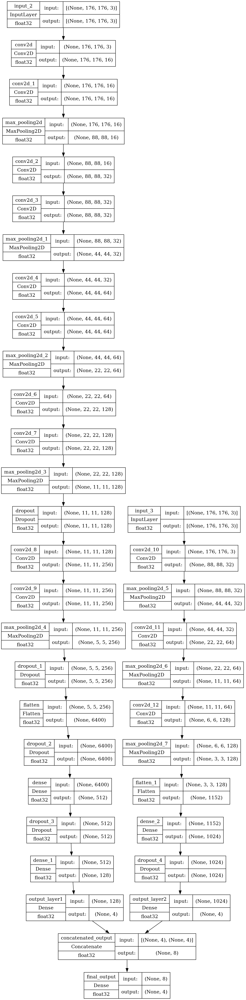

In [12]:
tf.keras.utils.plot_model(merged_model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [15]:
class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('val_acc') > 0.99:
            print("\nReached accuracy threshold! Terminating training.")
            self.model.stop_training = True
            
my_callback = MyCallback()
CALLBACKS = [my_callback]
EPOCHS = 50

history = model.fit(
    train_data, train_labels,
    validation_data=(X_val, y_val), 
    callbacks=CALLBACKS, 
    epochs=EPOCHS,
    verbose=0
)

In [13]:
checkpoint_cb =ModelCheckpoint("CNN_model.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=25, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(X_train,y_train, epochs=100, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb],verbose=0)

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Evaluating the CNN Model</h2>

In [14]:
hist_=pd.DataFrame(hist.history)

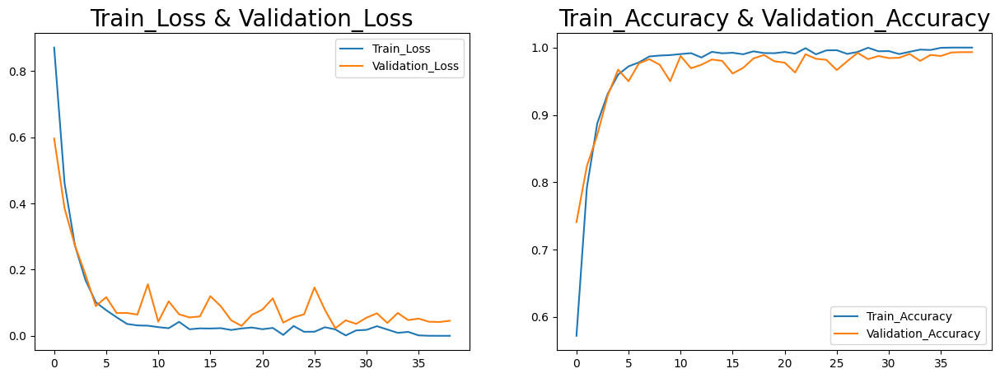

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'][:39],label='Train_Loss')
plt.plot(hist_['val_loss'][:39],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.xticks(range(0, 39, 5))
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'][:39],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'][:39],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.xticks(range(0, 39, 5))
plt.show()


In [16]:
score, acc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

60/60 [==============================] - 0s 7ms/step - loss: 0.0242 - accuracy: 0.9901
Test Loss = 0.024187330156564713
Test Accuracy = 0.9901041388511658


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Making Predictions on Sample Input</h2>

In [17]:
predictions = model.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})

60/60 [==============================] - 1s 7ms/step


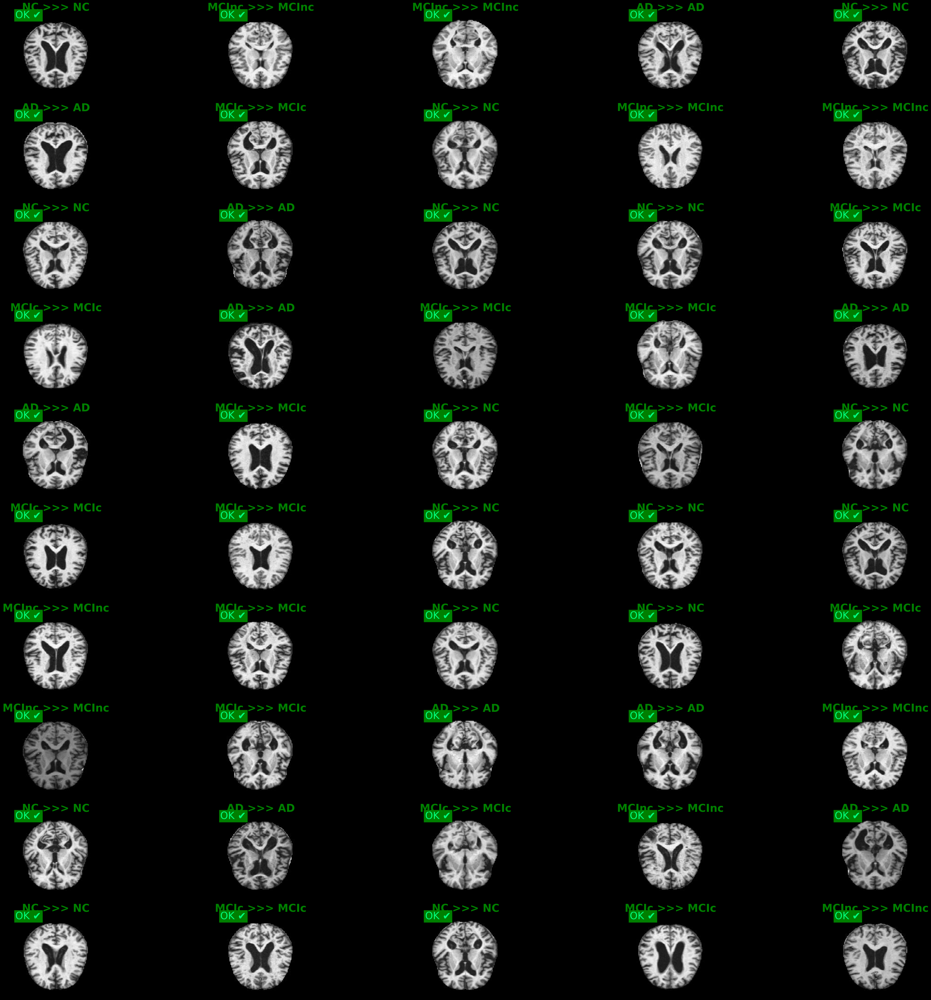

In [25]:
disease_mapping = {
    'Alzheimer_s disease':'AD',
    'Cognitively normal' : 'NC',
    'Early mild cognitive impairment': 'MCInc',
    'Late mild cognitive impairment' : 'MCIc',
}
plt.figure(figsize=(50,50),facecolor='black')
for n,i in enumerate(np.random.randint(0,len(X_test),50)):
    plt.subplot(10,5,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    if (class_num[y_test_[i]]==class_num[y_pred[i]]):
        plt.title(f'{disease_mapping[class_num[y_test_[i]]]} >>> {disease_mapping[class_num[y_pred[i]]]}',fontsize=30,color='green',fontweight="bold")
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=28)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))
    else:
        plt.title(f'{disease_mapping[class_num[y_test_[i]]]} >>> {disease_mapping[class_num[y_pred[i]]]}',fontsize=30,color='red',fontweight="bold")
        nok_text = plt.text(2, 10, "NOK \u2718", color="red", fontsize=28)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))

array([[479,   0,   1,   0],
       [  0, 480,   0,   0],
       [  1,   0, 471,   8],
       [  5,   0,   4, 471]])

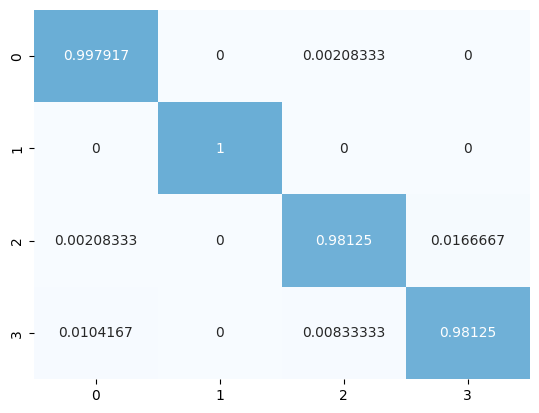

In [19]:
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [20]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.99      1.00      0.99       480
           1       1.00      1.00      1.00       480
           2       0.99      0.98      0.99       480
           3       0.98      0.98      0.98       480

    accuracy                           0.99      1920
   macro avg       0.99      0.99      0.99      1920
weighted avg       0.99      0.99      0.99      1920



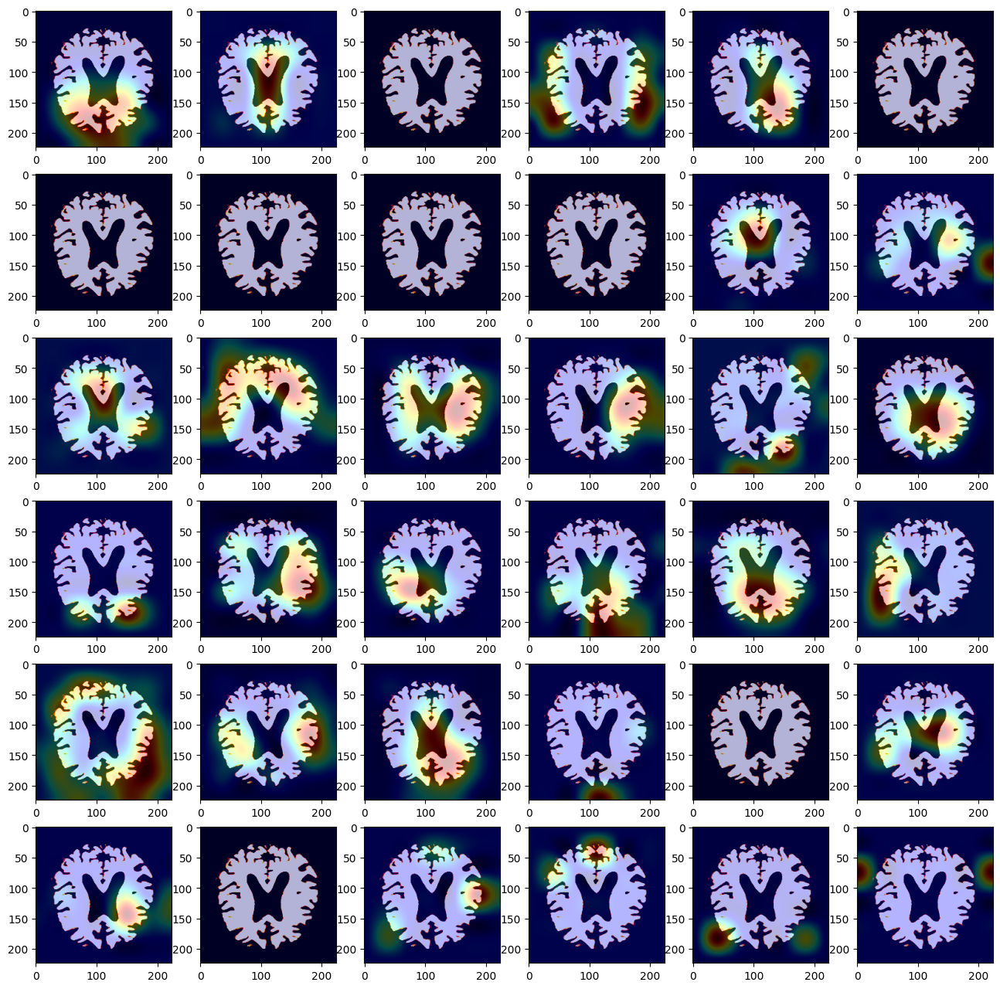

In [14]:
scale = 224 / 7
plt.figure(figsize=(16, 16))
for i in range(36):
    plt.subplot(6, 6, i + 1)
    
    # Remove the batch dimension and plot the stretched image
    plt.imshow(np.squeeze(X, axis=0))
    
    # Plot the zoomed activation map on top of the image
    plt.imshow(zoom(conv[0, :, :, i], zoom=(scale, scale)), cmap='jet', alpha=0.3)

plt.show()


<h2 style="color: white; background-color: gray; font-weight: bold; text-align: center; border:3px solid black;">Heat Maps</h2>

In [2]:
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
img = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/test/VeryMildDemented/32 (54).jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
X = np.expand_dims(img, axis=0).astype(np.float32)
'''resized_X = tf.image.resize(X, (224, 224))
X=resized_X'''
X = preprocess_input(X)

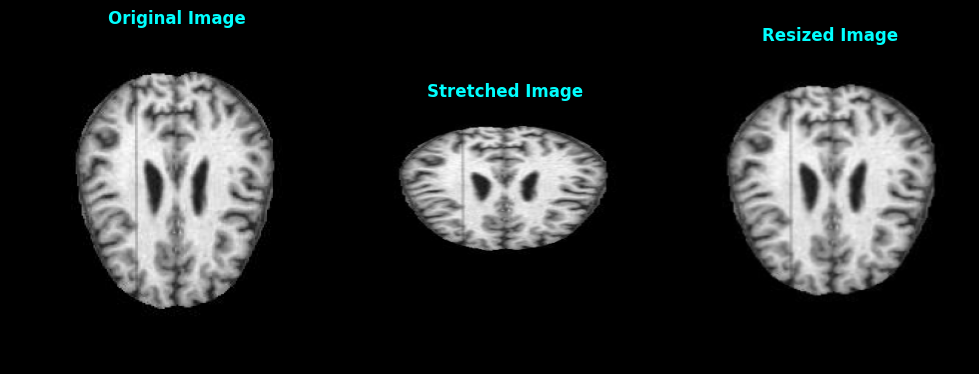

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

# Load the image
img = cv2.imread('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/test/VeryMildDemented/32 (54).jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Stretch the image
stretch_factor_width = 2  # You can adjust this factor based on your preference
stretch_factor_height = 1

new_width = int(img.shape[1] * stretch_factor_width)
new_height = int(img.shape[0] * stretch_factor_height)

stretched_img = cv2.resize(img, (new_width, new_height))

resized_img = cv2.resize(stretched_img, (224, 224))

# Display the original, stretched, and resized images
plt.figure(figsize=(12, 4),facecolor='black')
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image',color='cyan',fontweight='bold')

plt.subplot(1, 3, 2)
plt.imshow(stretched_img)
plt.title('Stretched Image',color='cyan',fontweight='bold')

plt.subplot(1, 3, 3)
plt.imshow(resized_img)
plt.title('Resized Image ',color='cyan',fontweight='bold')

plt.show()

X = np.expand_dims(resized_img, axis=0).astype(np.float32)
X = preprocess_input(X)




In [4]:
from tensorflow.keras.models import Model
conv_output = res_model.get_layer("conv5_block3_out").output;
pred_output = res_model.get_layer("predictions").output;
model = Model(res_model.input, outputs=[conv_output, pred_output]);
conv, pred = model.predict(X);
decode_predictions(pred);

35363/35363 [==============================] - 0s 0us/step


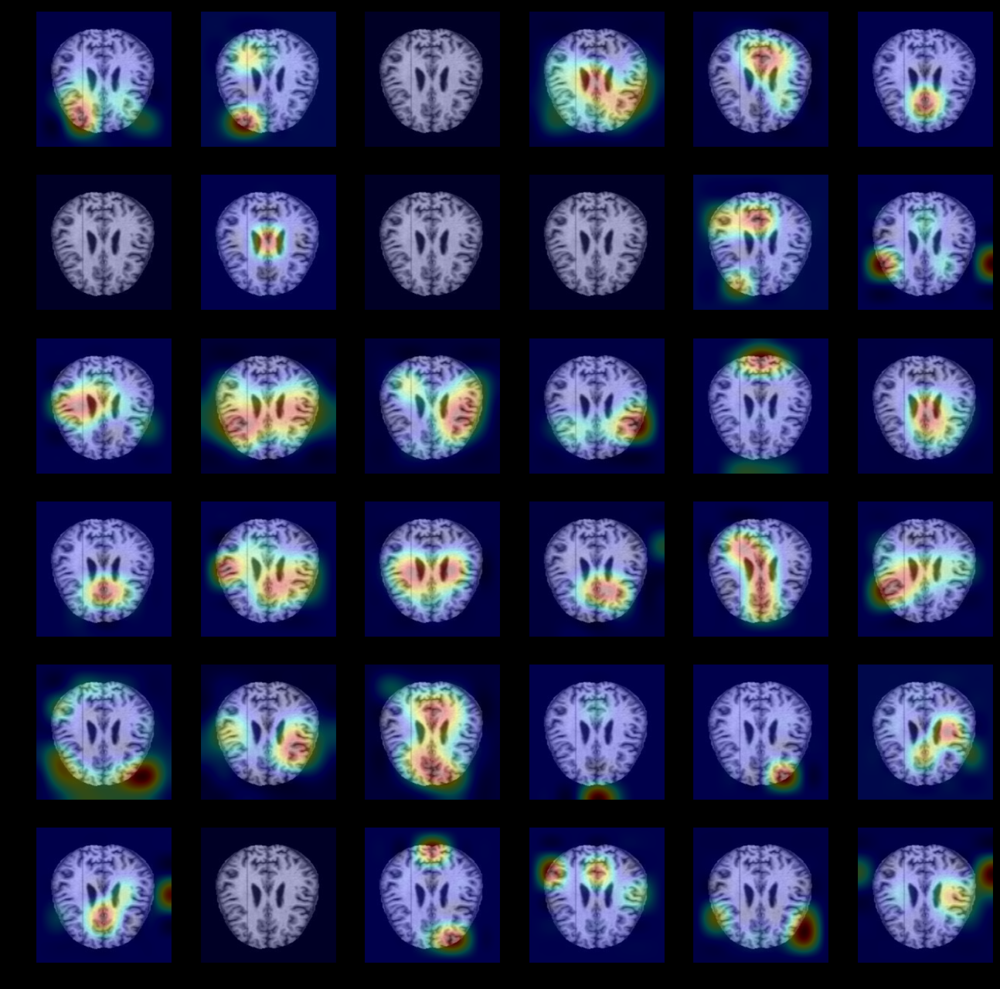

In [5]:
scale = 224 / 7
plt.figure(figsize=(16, 16),facecolor='black')
for i in range(36):
    plt.subplot(6, 6, i + 1)
    plt.imshow(resized_img)
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.3)

In [6]:
target = np.argmax(pred, axis=1).squeeze()
w, b = model.get_layer("predictions").weights
weights = w[:, target].numpy()
heatmap = conv.squeeze() @ weights

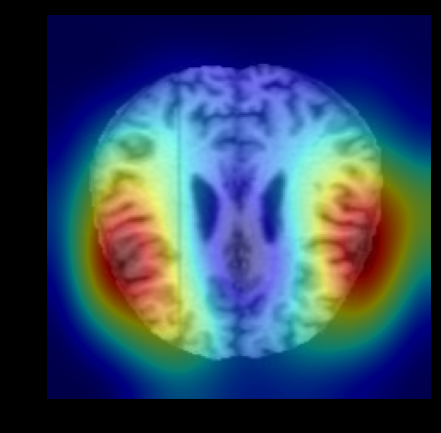

In [10]:
scale = 224 / 7
plt.figure(figsize=(5, 5),facecolor='black')
plt.imshow(resized_img)
plt.imshow(zoom(heatmap, zoom=(scale, scale)), cmap='jet', alpha=0.5)